# adapting published Drosophila dataset for SAMap integration and comparison of cell types
dataset published in Wang et al, 2025 - https://wwwdataset published in .cell.com/cell/fulltext/S0092-8674(25)00629-4


In [ ]:
import scanpy as sc
dmel_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
adata = sc.read_h5ad(dmel_dir + 'wcoembed_whole_embeding_downsampled_modified.h5ad')

In [ ]:
adata_raw = adata.raw.to_adata()

In [ ]:
adata_raw.var_names = adata_raw.var['index']
adata_raw.var_names

In [ ]:
# remove cells with zero counts
adata_dm = adata_raw[adata_raw.X.sum(axis=1) > 0].copy()

In [ ]:
# reduce to comparable numbers (before first revision, subset to 30.000 cells)
import numpy as np

# Random reproducible seed
np.random.seed(33)  # Annas number

cell_indices = np.arange(adata_dm.n_obs)
div = len(cell_indices)/30000
subset_indices = np.random.choice(cell_indices, size= int(adata_dm.n_obs // div), replace=False)
print(len(cell_indices))
print(len(subset_indices))

adata_subset = adata_dm[subset_indices, :]

In [ ]:
# pca, neighbors, dimensionaility reduction
sc.tl.pca(adata_subset, n_comps=50)
sc.pp.neighbors(adata_subset, n_pcs=50)
sc.tl.umap(adata_subset)

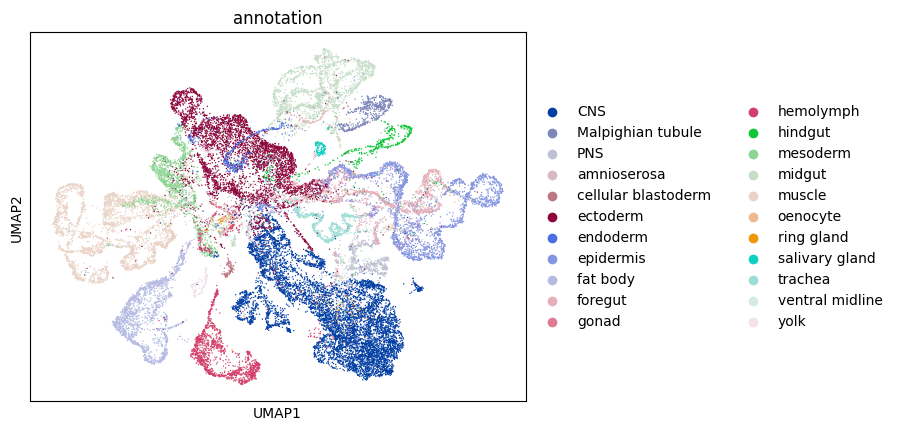

In [3]:
sc.pl.umap(adata_subset, color='annotation')

In [ ]:
# 1 create a broad annotation containing entries from 'annotation' plus the specific glial cell types

adata_subset.obs["samap_anno"] = adata_subset.obs["annotation"].astype(str)

glia_anno = [
    "astocyte glia",
    "astrocyte glia",
    "chiasm glia",
    "chiasm/cortex glia",
    "chordotonal glia",
    "cortex_glia",
    "glioblasts",
    "midline glia",
    "sensory glia",
    "surface glia"
]

mask = adata_subset.obs["celltype_in_monomics"].isin(glia_anno)

# update the barcodes with the entry in 'celltype_in_monomics', which overlap with entries in glia_anno list
adata_subset.obs.loc[mask, "samap_anno"] = (
    adata_subset.obs.loc[mask, "celltype_in_monomics"].astype(str)
)

# typo in astrocyte annotation
adata_subset.obs['samap_anno'] = adata_subset.obs['samap_anno'].str.replace('astocyte glia', 'astrocyte glia')

In [ ]:
# 2 create a broader annotation, fitting with the mollusc annotation

# summarise ectodermal tissues into NS
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('trachea', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('fat body', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('muscle', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('midgut', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('epidermis', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('PNS', 'NS')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('CNS', 'NS')


# summarise glial subtypes into GLIA annotation
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('astocyte glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('astrocyte glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('chiasm glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('chiasm/cortex glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('chordotonal glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('cortex glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('cortex_glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('midline glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('sensory glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('surface glia', 'GLIA')
adata.obs['samap_anno'] = adata.obs['samap_anno'].str.replace('glioblasts', 'GLIA')

# for other tissues, take annotation from 'germ_layer' entries
mask = adata.obs["germ_layer"].isin(['mesoderm', 'endoderm', 'ectoderm', 'mesectoderm', 'blastoderm', 'extra-embryonic'])

# make sure entries are strings
adata.obs["samap_anno"] = adata.obs["samap_anno"].astype(str)

# add germ_layer annotation to overlapping barcodes
adata.obs.loc[mask, "samap_anno"] = (
    adata.obs.loc[mask, "germ_layer"].astype(str)
)

In [ ]:
sc.tl.pca(adata, n_comps=50)
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.umap(adata)

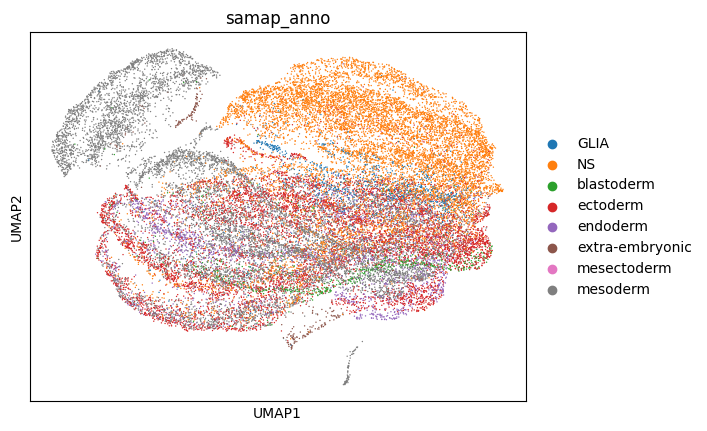

In [8]:
sc.pl.umap(adata, color='samap_anno')

In [3]:
import scanpy as sc
dmel_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
adata = sc.read_h5ad(dmel_dir + 'Dmel_subset_for_samap.h5ad')

In [4]:
adata.obs['samap_anno'].value_counts()

samap_anno
mesoderm           9726
NS                 9496
ectoderm           6923
endoderm           1872
GLIA               1003
blastoderm          654
extra-embryonic     281
mesectoderm          45
Name: count, dtype: int64

In [ ]:
# 3 after revision, downscale the cell number to comparable numbers to all other dataset, create clear annotation of neurons
import scanpy as sc
dmel_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
adata = sc.read_h5ad(dmel_dir + 'Dmel_subset_for_samap.h5ad')

div = 21088  
divi = len(adata.obs)/div

import numpy as np

# Random reproducible seed
np.random.seed(33)  # Annas number

cell_indices = np.arange(adata.n_obs)
subset_indices = np.random.choice(cell_indices, size= int(adata.n_obs // divi)+1, replace=False)
print(len(cell_indices))
print(len(subset_indices))

# Subset the AnnData object
samap_subset = adata[subset_indices, :]

In [19]:
# adapated samap annotation in an excel sheet, looking at all celltypes (derived from .obs['celltypes_in_monomics']
import pandas as pd
dm_anno = pd.read_csv('tables/misc/celltype_in_monomics_DM_samap.csv', sep=';', header = 1)
dm_anno.head()


,celltype_in_monomics,count,samap_name_1,samap_name_2
0,mature neurons,3394,mature neurons,N-DIFF
1,plasmatocytes,930,hemolymph,MES
2,procephalic ectoderm,713,procephalic ectoderm,N-PROG
3,lymph gland,662,hemolymph,MES
4,neural progenitors,603,neural progenitors,N-DIFF


In [20]:
# Create a mapping dictionary
mapping = dm_anno.set_index("celltype_in_monomics")["samap_name_2"]
mapping

celltype_in_monomics
mature neurons                      N-DIFF
plasmatocytes                          MES
procephalic ectoderm                N-PROG
lymph gland                            MES
neural progenitors                  N-DIFF
                                    ...   
anal pad                          ectoderm
fat body/gonad primordium              MES
primordial germ cells                  MES
entero-endocrine cells (AstA+)    endoderm
entero-endocrine cells (NFP+)     endoderm
Name: samap_name_2, Length: 136, dtype: object

In [ ]:
# Add the new column to the adata object
samap_subset.obs["samap_name_2"] = (
    samap_subset.obs["celltype_in_monomics"].map(mapping)
)

In [22]:
samap_subset.obs["samap_name_2"].value_counts()

samap_name_2
MES                6844
N-DIFF             5362
ectoderm           4009
N-PROG             1975
endoderm           1310
GLIA                921
blastoderm          464
extra-embryonic     203
Name: count, dtype: int64

In [ ]:
import scanpy as sc
dmel_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
samap_subset.write_h5ad(dmel_dir + 'Dmel_subset_for_samap_downsampled_revision.h5ad')

In [ ]:
# 4 plots for figures
import scanpy as sc
dmel_dir = '/staging/leuven/stg_00171/Mark/Dmel_dataset/'
samap_subset = sc.read_h5ad(dmel_dir + 'Dmel_subset_for_samap_downsampled_revision.h5ad')

In [ ]:
sc.tl.pca(samap_subset, n_comps=50)
sc.pp.neighbors(samap_subset, n_pcs=50)
sc.tl.umap(samap_subset, key_added = 'umap_50dims')

In [25]:
# UMAP bplot for Supplementary Figure 5
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False)
sc.settings.figdir = 'figures/paper/revision/Supplementary/'


sc.pl.embedding(samap_subset, color=['timeslot', 'tissue', 'samap_name_1', 'samap_name_2'], basis='umap_50dims', ncols=1, cmap='Dark2',
               save = '_Dmel_annotations.pdf'
               )

In [ ]:
# Sankey plot for Supplementary Figure 5, aim to show how the samap annotation was generated

import numpy as np
import pandas as pd

target_col = "samap_name_2"

neural_targets = [
    "N-PROG",
    "N-DIFF",
    "GLIA"
]

samap_subset.obs["alluvial_source"] = np.where(
    samap_subset.obs[target_col].isin(neural_targets),
    samap_subset.obs["celltype_in_monomics"],
    samap_subset.obs["tissue"]
)

samap_subset.obs["alluvial_source"] = (
    samap_subset.obs["alluvial_source"]
    .astype("string")
    .fillna("Unknown")
    .astype("category")
)


In [ ]:
source_counts = (
    samap_subset.obs["alluvial_source"]
    .value_counts()
)

small_sources = source_counts[
    source_counts < 10
].index

samap_subset.obs["alluvial_source_plot"] = (
    samap_subset.obs["alluvial_source"]
    .astype("string")
)

samap_subset.obs.loc[
    samap_subset.obs["alluvial_source"].isin(small_sources),
    "alluvial_source_plot"
] = "Other"

In [ ]:
# generate the flow table

flows = (
    samap_subset.obs[
        ["alluvial_source", "samap_name_2"]
    ]
    .dropna()
    .groupby(
        ["alluvial_source", "samap_name_2"],
        observed=True
    )
    .size()
    .reset_index(name="count")
)

In [ ]:
# plotting function, generated with ChatGPT

def plot_two_level_alluvial(
    flows,
    source_col,
    target_col,
    value_col="count",
    source_order=None,
    target_order=None,
    figsize=(12, 10),
    gap=0.015,
    node_width=0.025,
    source_x=0.20,
    target_x=0.80,
    alpha=0.55,
    label_size=10,
    colors=None,
):
    flows = flows.copy()

    # Ensure numeric values
    flows[value_col] = pd.to_numeric(flows[value_col])

    # Default ordering: largest categories first
    if source_order is None:
        source_order = (
            flows.groupby(source_col, observed=True)[value_col]
            .sum()
            .sort_values(ascending=False)
            .index
            .tolist()
        )

    if target_order is None:
        target_order = (
            flows.groupby(target_col, observed=True)[value_col]
            .sum()
            .sort_values(ascending=False)
            .index
            .tolist()
        )

    # Restrict to chosen categories
    flows = flows[
        flows[source_col].isin(source_order)
        & flows[target_col].isin(target_order)
    ].copy()

    source_totals = (
        flows.groupby(source_col, observed=True)[value_col]
        .sum()
        .reindex(source_order)
        .fillna(0)
    )

    target_totals = (
        flows.groupby(target_col, observed=True)[value_col]
        .sum()
        .reindex(target_order)
        .fillna(0)
    )

    # Vertical space available after gaps
    source_available = 1 - gap * (len(source_order) - 1)
    target_available = 1 - gap * (len(target_order) - 1)

    total = flows[value_col].sum()

    source_scale = source_available / total
    target_scale = target_available / total

    # Use one common ribbon scale
    scale = min(source_scale, target_scale)

    def make_positions(order, totals):
        positions = {}
        current_top = 1.0

        for label in order:
            height = totals.loc[label] * scale
            bottom = current_top - height

            positions[label] = {
                "top": current_top,
                "bottom": bottom,
                "height": height,
            }

            current_top = bottom - gap

        return positions

    source_pos = make_positions(source_order, source_totals)
    target_pos = make_positions(target_order, target_totals)

    # Default source colors
    if colors is None:
        cmap = plt.get_cmap("tab20")
        colors = {
            label: cmap(i % cmap.N)
            for i, label in enumerate(source_order)
        }

    # Running offsets inside each node
    source_cursor = {
        label: source_pos[label]["top"]
        for label in source_order
    }

    target_cursor = {
        label: target_pos[label]["top"]
        for label in target_order
    }

    fig, ax = plt.subplots(figsize=figsize)

    # Fixed axes area: avoids tight_layout warning
    fig.subplots_adjust(
        left=0.22,
        right=0.78,
        top=0.97,
        bottom=0.03
    )

    # Draw flows source-by-source
    for source in source_order:

        source_flows = flows[
            flows[source_col] == source
        ].copy()

        source_flows[target_col] = pd.Categorical(
            source_flows[target_col],
            categories=target_order,
            ordered=True
        )

        source_flows = source_flows.sort_values(target_col)

        for _, row in source_flows.iterrows():
            target = row[target_col]
            count = row[value_col]

            height = count * scale

            sy_top = source_cursor[source]
            sy_bottom = sy_top - height

            ty_top = target_cursor[target]
            ty_bottom = ty_top - height

            source_cursor[source] = sy_bottom
            target_cursor[target] = ty_bottom

            x0 = source_x + node_width
            x1 = target_x

            dx = x1 - x0

            vertices = [
                (x0, sy_top),
                (x0 + dx * 0.40, sy_top),
                (x1 - dx * 0.40, ty_top),
                (x1, ty_top),

                (x1, ty_bottom),

                (x1 - dx * 0.40, ty_bottom),
                (x0 + dx * 0.40, sy_bottom),
                (x0, sy_bottom),

                (x0, sy_top),
            ]

            codes = [
                Path.MOVETO,
                Path.CURVE4,
                Path.CURVE4,
                Path.CURVE4,

                Path.LINETO,

                Path.CURVE4,
                Path.CURVE4,
                Path.CURVE4,

                Path.CLOSEPOLY,
            ]

            ribbon = PathPatch(
                Path(vertices, codes),
                facecolor=colors[source],
                edgecolor="none",
                alpha=alpha,
                zorder=1
            )

            ax.add_patch(ribbon)

    # Source nodes and labels
    for source in source_order:
        pos = source_pos[source]

        ax.add_patch(
            Rectangle(
                (source_x, pos["bottom"]),
                node_width,
                pos["height"],
                facecolor=colors[source],
                edgecolor="black",
                linewidth=0.4,
                zorder=3
            )
        )

        ax.text(
            source_x - 0.015,
            pos["bottom"] + pos["height"] / 2,
            str(source),
            ha="right",
            va="center",
            fontsize=label_size,
            clip_on=False
        )

    # Target nodes and labels
    for target in target_order:
        pos = target_pos[target]

        incoming = flows[flows[target_col] == target]

        dominant_source = (
            incoming.groupby(source_col, observed=True)[value_col]
            .sum()
            .idxmax()
        )

        ax.add_patch(
            Rectangle(
                (target_x, pos["bottom"]),
                node_width,
                pos["height"],
                facecolor=colors[dominant_source],
                edgecolor="black",
                linewidth=0.4,
                zorder=3
            )
        )

        ax.text(
            target_x + node_width + 0.015,
            pos["bottom"] + pos["height"] / 2,
            str(target),
            ha="left",
            va="center",
            fontsize=label_size,
            clip_on=False
        )

    ax.set_xlim(0, 1)
    ax.set_ylim(-0.02, 1.02)
    ax.axis("off")

    return fig, ax

In [ ]:
# create the plot with the three annotations on top

priority = ["GLIA", "N-PROG", "N-DIFF"]

target_order = priority + [
    target
    for target in flows["samap_name_2"].dropna().unique()
    if target not in priority
]

# create dominant target per source
dominant_target = (
    flows.loc[
        flows.groupby("alluvial_source", observed=True)["count"].idxmax()
    ]
    .set_index("alluvial_source")["samap_name_2"]
)

# construct left-side order explicitely
source_order = []

for target in target_order:
    sources_for_target = dominant_target[
        dominant_target == target
    ].index.tolist()

    # Optional: alphabetical ordering within each target group
    sources_for_target = sorted(sources_for_target)

    source_order.extend(sources_for_target)

source_order_df = pd.DataFrame({
    "dominant_target": dominant_target
})

source_order_df = source_order_df.loc[source_order]

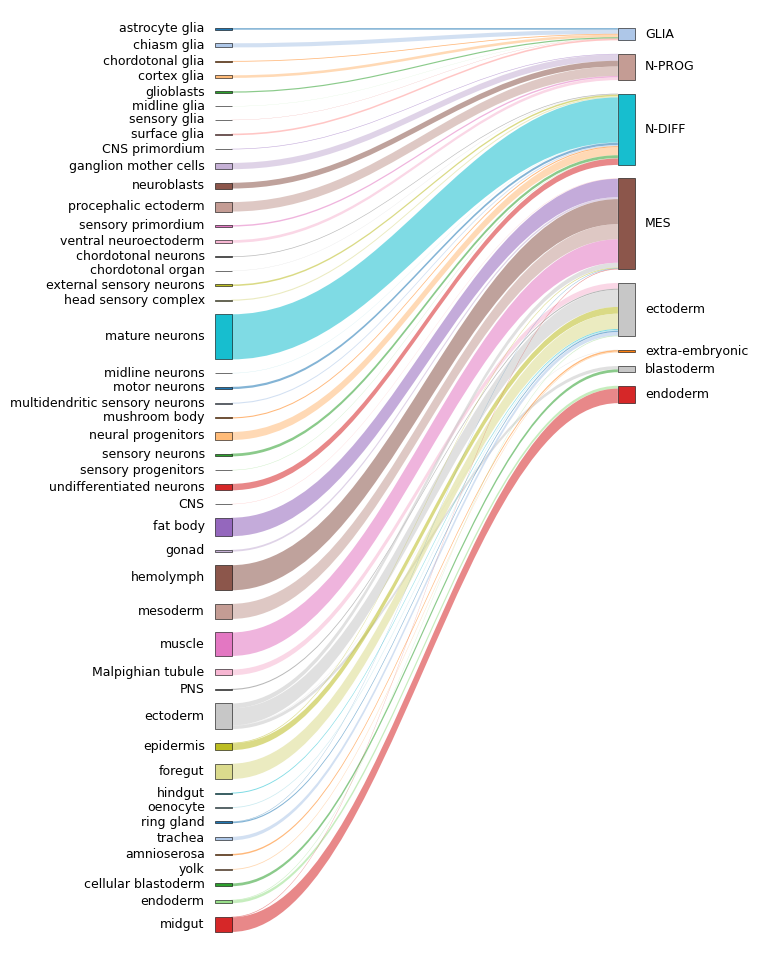

In [74]:
fig, ax = plot_two_level_alluvial(
    flows=flows,
    source_col="alluvial_source",
    target_col="samap_name_2",
    source_order=source_order,
    target_order=target_order,
    figsize=(12, 10),
    gap=0.015,
    node_width=0.025,
    alpha=0.55,
    label_size=9
)

plt.savefig('figures/paper/revision/samap_annotation_flow.pdf', dpi=300)
plt.show()